# IPP Coding: Block-based Motion-Compensated Video Coding

David Emanuel Tarca -
Cristian David Gaspar Soto -
Patricio Marcos Bibang Mba Sima -
Ilias Chat -
Abdellah Aarab

En este notebook se explica la implementación de un códec de vídeo IPP
(Intra–Predicted–Predicted) basado en bloques, con compensación de movimiento
y optimización tasa–distorsión (RDO).

El códec procesa secuencias de vídeo frame a frame y utiliza:
- Predicción intra (I)
- Predicción inter con estimación de movimiento (P)
- Información lateral (vectores de movimiento y modos)
- Un códec de transformada 2D externo para comprimir los residuos

## Imports y dependencias

Se utilizan las siguientes librerías:

- NumPy: operaciones matriciales y cálculo de errores
- PIL: lectura y escritura de imágenes PNG
- PyAV: decodificación de vídeo de entrada
- gzip: compresión de la información lateral
- importlib: carga dinámica del códec de transformada


In [ ]:
import os
import logging
import numpy as np
from PIL import Image
import av
import importlib
import parser
import main
from III import *
import gzip

## Parámetros específicos del códec IPP

El códec permite configurar varios parámetros relevantes:

- Tamaño de GOP: frecuencia de I-frames
- Tamaño de bloque: granularidad espacial
- Rango de búsqueda: precisión de la estimación de movimiento
- Lambda RDO: compromiso tasa–distorsión

Estos parámetros influyen directamente en la calidad, complejidad
y eficiencia de compresión.


In [ ]:
parser.parser_encode.add_argument("--input_prefix", required=True, help="Input video")
parser.parser_encode.add_argument("--output_prefix", default="/tmp/ipp", help="Output directory")
parser.parser_encode.add_argument("-G", "--gop_size", type=int, default=10)
parser.parser_encode.add_argument("-b", "--block_size", type=int, default=16, help="IPP block size")
parser.parser_encode.add_argument("-S", "--search_range", type=int, default=4)
parser.parser_encode.add_argument("--lambda_rdo", type=float, default=0.01, help="IPP Lambda for RDO")

parser.parser_decode.add_argument("-o", "--output_prefix", default="/tmp/ipp", help="Input directory")
parser.parser_decode.add_argument("-G", "--gop_size", type=int, default=10)
parser.parser_decode.add_argument("-b", "--block_size", type=int, default=16, help="IPP block size")

## Clase CoDec

La clase `CoDec` encapsula toda la lógica del códec IPP.
Se encarga de:
- Inicializar el códec de transformada externo
- Ejecutar la codificación
- Ejecutar la decodificación

La implementación está pensada para ser modular, permitiendo cambiar
el códec de transformada sin modificar el resto del sistema.


In [ ]:
class CoDec:
    def __init__(self, args):
        self.args = args
        self.B = getattr(args, "block_size", None)
        transform_module = importlib.import_module(args.transform)
        self.transform_codec = transform_module.CoDec(args)

## Función encode

### Inicialización de variables con parámetros

Se leen los valores de los parámetros pasados por línea de comandos, además de inicializar la lectura del video con la libreria de av. Tambien se inicializan las variables para el contador de indice de fotograma, para calcular si es I o P en el GOP, y tambien el frame de referencia a None


In [ ]:
    def encode(self):
        os.makedirs(self.args.output_prefix, exist_ok=True)
        container = av.open(self.args.input_prefix)
        B = self.args.block_size
        SEARCH = self.args.search_range
        GOP = self.args.gop_size
        LAMBDA = self.args.lambda_rdo

        ref_frame = None
        frame_idx = 0

## Bucle de procesado de imagenes. Procesado de imagens tipo I

Para obtener los frames por separado, es necesario utilizar un bucle anidado donde primero se obtiene el packet, y de ese packet se obtienen los frames. Se convierte el frame a un array de numpy, se obtienen las dimensiones de la imagen, guardadas en H y W, se inicializan los arrays con los vectores de movimiento (mv) y de especificacion del tipo de bloque (I o P).

Se comprueba si el frame es primero del GOP (mediante operacion módulo), y en ese caso, al ser del tipo I, simplememente se copia la imagen para guardarla, y tambien se establece como imagen reconstruida de referencia para la siguiente imagen, guarda en la variable recon.

In [ ]:
        for packet in container.demux():
            for frame in packet.decode():
                curr = np.array(frame.to_image()).astype(np.int16)
                H, W = curr.shape[:2]

                # ---------------- Inicialización ----------------
                mv = np.zeros((H // B, W // B, 2), dtype=np.int16)
                modes = np.zeros((H // B, W // B), dtype=np.uint8)

                # ---------------- I-FRAME ----------------
                if ref_frame is None or frame_idx % GOP == 0:
                    #frame_type = "I"
                    # Todo bloque es intra
                    to_save_img = curr.copy()
                    recon = curr.copy()

## Procesado de imagenes "P". Cálculo de RDO.

A la hora de procesar las imágenes de tipo P, se van procesando bloques del tamaño determinado para ver si es mejor guardarlos como tipo P, o como tipo I (de ahí sale la necesidad de guardar un aaray de modos de bloque). La decisión se haría en base al RDO de dicho bloque, calculando el valor RD de los dos casos, P e I, y eligiendo el que sea mejor.

El problema surge cuando el cálculo de RD solo se puede hacer tras aplicar la trasnformada al bloque. Los modulos del proyecto solo tienen funciones que aplican la transformada a un archivo, y no a datos en memoria, lo que solo permitiria en un principio calcular el RD habiendo elegido ya el tipo de bloque.

La solucion a este problema ha sido tener dos imagenes auxiliares, test_I y test_P, que son imagenes con todos los bloques I y todos los bloques P, respectivamente, y las que se le ha aplicado ya la transformada. Entonces, lo que se va haciendo es calcular el RD para el mismo bloque, pero en los distintos casos donde es I y donde es P, y el mejor de ellos se guarda en la imagen final.

![Diagrama RDO](https://drive.google.com/uc?export=download&id=18P6prXQTjLRugJPmp2ye5W0LoJH4cKiG)




### Cálculo de Bloques P

El cálculo de **bloques P** consiste en determinar la diferencia entre la **imagen actual** y la **imagen de referencia anterior** (predicción). Sin embargo, esta diferencia no se calcula de manera directa. En su lugar, se aplica **ME/MC (Motion Estimation & Compensation)** para encontrar el bloque más similar al bloque que se está analizando, y luego calcular la diferencia respecto a él.

---

#### Variables principales

* **`recon`**: Imagen reconstruida.

  * Se inicializa con ceros y tiene las mismas dimensiones que el frame actual.
* **`test_P`**: Imagen P que se va a calcular.

  * Se inicializa igual que `recon`.
* **`test_I`**: Imagen I (intra-frame).

  * Es simplemente una copia exacta del frame actual.

---

#### Selección de bloques

Para procesar la imagen, se utilizan **bucles anidados** que recorren la imagen bloque a bloque:

* Los límites de los bucles están definidos por la **altura (H)** y **anchura (W)** del frame.
* La iteración avanza de **B en B píxeles**, donde **B** es el tamaño del bloque.

> En este paso se selecciona el bloque sobre el que se va a trabajar.

---

#### Búsqueda del bloque más similar

Una vez seleccionado el bloque actual:

1. Se utilizan otros dos bucles anidados para **buscar bloques vecinos** que se parezcan al bloque analizado.
2. Las variables **`dx`** y **`dy`** representan la distancia en píxeles entre el bloque de referencia y los bloques candidatos.
3. Con estas distancias se puede formar el **vector de movimiento**.

---

#### Cálculo de similitud

Para determinar qué bloque es el más parecido, se utiliza **SAD (Sum of Absolute Differences)**:

* Se calcula la diferencia entre los píxeles correspondientes de ambos bloques.
* Se suman todas las diferencias.
* El bloque con el **SAD más bajo** será el bloque más similar al bloque analizado.

El calculo de residual se realiza restando al bloque actual el bloque de mayor semejanza. Al residual se le aplica un offset de +128, para poder luego guardarlo como archivo PNG. También se guarda los valores dx y dy, con los que se compone el vector de movimiento.

In [ ]:
                else:
                    #frame_type = "P"
                    recon = np.zeros_like(curr)

                    # Prepara imagenes todo I y todo P
                    test_I = curr.copy()  # todo I
                    test_P = np.zeros_like(curr)  # todo P
                    for y in range(0, H, B):
                        for x in range(0, W, B):
                            by, bx = y // B, x // B
                            block = curr[y:y+B, x:x+B]

                            # --- Motion Estimation ---
                            best_sad = np.inf
                            best_pred = None
                            best_dy = best_dx = 0
                            for dy in range(-SEARCH, SEARCH+1):
                                for dx in range(-SEARCH, SEARCH+1):
                                    ry, rx = y+dy, x+dx
                                    if ry<0 or rx<0 or ry+B>H or rx+B>W:
                                        continue
                                    cand = ref_frame[ry:ry+B, x+dx:x+dx+B]
                                    sad = np.sum(np.abs(block - cand))
                                    if sad < best_sad:
                                        best_sad = sad
                                        best_pred = cand
                                        best_dy, best_dx = dy, dx

                            residual = block - best_pred
                            test_P[y:y+B, x:x+B] = residual + 128
                            mv[by, bx] = (best_dy, best_dx)

SyntaxError: invalid syntax (ipython-input-1189676613.py, line 1)

### Transformacion de Test_P y Test_I

Tras obtener las imagenes auxiliares test_P y test_I, se les aplica la transformada. Una vez aplicada, se obtiene la decodificacion de la transformada.

In [ ]:
                    # Guardar imágenes para aplicar transformada
                    test_I_png = f"{self.args.output_prefix}/frame_test_I_{frame_idx:04d}.png"
                    test_P_png = f"{self.args.output_prefix}/frame_test_P_{frame_idx:04d}.png"
                    Image.fromarray(np.clip(test_I, 0, 255).astype(np.uint8)).save(test_I_png)
                    Image.fromarray(np.clip(test_P, 0, 255).astype(np.uint8)).save(test_P_png)
                    self.transform_codec.encode_fn(test_I_png, test_I_png.replace(".png",""))
                    self.transform_codec.encode_fn(test_P_png, test_P_png.replace(".png",""))

                    decoded_I_png = f"{self.args.output_prefix}/frame_test_I_decoded_{frame_idx:04d}.png"
                    decoded_P_png = f"{self.args.output_prefix}/frame_test_P_decoded_{frame_idx:04d}.png"
                    self.transform_codec.decode_fn(test_I_png.replace(".png",""), decoded_I_png)
                    self.transform_codec.decode_fn(test_P_png.replace(".png",""), decoded_P_png)

                    decoded_I = np.array(Image.open(decoded_I_png)).astype(np.int16)
                    decoded_P = np.array(Image.open(decoded_P_png)).astype(np.int16)

## Cálculo de mejores bloques

Tras calcular test_I y test_P, se procede al la obtencion de la imagen resultante, calculando el RD de los bloques P e I y eligiendo el mejor.

Al igual que en apartado anterior, se utilizan dos bucles anidados para el recorrido de la imagen mediante la division en bloques. Los bloques I se obtienen de la imagen decodificada de test_I; lo equivalente se aplica a los bloques P.

Tras obtener los bloques I y P de la misma posicion, se comparan mediante su RD.
El RD es una **función de coste Lagrangiana** que combina la distorsión y la tasa de la siguiente manera: (J = D + \lambda R), donde (\lambda) es un parámetro que pondera la importancia relativa de la compresión frente a la fidelidad de reconstrucción. D seria la distorsion de la imagen reconstruida frente a la original y y R el bitrate

La **distorsión de reconstrucción D**, se calcula como el **error cuadrático medio (MSE)** entre el bloque original y el bloque reconstruido. En el modo intra, la distorsión se evalúa directamente sobre el bloque decodificado sin predicción. En el modo predictivo, la reconstrucción se obtiene sumando el bloque predicho en el frame de referencia con el residual decodificado, ajustado previamente para centrar sus valores en torno a cero.

La **tasa de bits** se aproxima mediante una heurística basada en la energía del bloque decodificado, asumiendo que bloques con mayor energía requieren más bits para ser codificados. Esta aproximación permite un cálculo rápido del coste, aunque no refleja el número exacto de bits transmitidos.


Una vez calculado J para los dos bloques se comparan para ver cuales tienen un menor valor.

*   En el caso de que sea el bloque I, simplemente se copia el bloque como tal a la imagen a guardar y en la reconstruida, utilizada como referencia, además de que se guarda el tipo de bloque en el array modes.

*   Para el caso del bloque P, se copoa el residual del bloque en la imagen a guardar, se guarda el vector de movimiento, y tambien guarda el bloque reconstruido calculado anteriormente para la obtencion de la distorsion en el caso de bloque predictivo.

In [ ]:
# ---------------- Comparación bloque a bloque con RDO simplificado ----------------
                    to_save_img = np.zeros_like(curr)
                    for y in range(0, H, B):
                        for x in range(0, W, B):
                            by, bx = y // B, x // B
                            block_I = decoded_I[y:y+B, x:x+B]
                            block_P = decoded_P[y:y+B, x:x+B]

                            # Distorsión D = MSE
                            D_I = np.mean((curr[y:y+B, x:x+B] - block_I)**2)

                            res_block = decoded_P[y:y+B, x:x+B] - 128
                            dy, dx = mv[by, bx]                        # vector de movimiento
                            pred_block = ref_frame[y+dy:y+dy+B, x+dx:x+dx+B]  # bloque predicho
                            recon_block = pred_block + res_block       # reconstrucción real
                            D_P = np.mean((curr[y:y+B, x:x+B] - recon_block)**2)

                            # Heurística para R
                            R_I = np.sum(np.abs(block_I))
                            R_P = np.sum(np.abs(block_P))

                            # J = D + λ * R
                            J_I = D_I + LAMBDA * R_I
                            J_P = D_P + LAMBDA * R_P

                            if J_I <= J_P:
                                to_save_img[y:y+B, x:x+B] = test_I[y:y+B, x:x+B]
                                modes[by, bx] = 0
                                recon[y:y+B, x:x+B] = test_I[y:y+B, x:x+B]
                            else:
                                to_save_img[y:y+B, x:x+B] = test_P[y:y+B, x:x+B]
                                modes[by, bx] = 1
                                recon[y:y+B, x:x+B] = recon_block

IndentationError: unexpected indent (ipython-input-151374901.py, line 2)

### Guardado de imagen resultante

Tras obtener la imagen P final con los bloques óptimos, se guarda la imagen, aplicando la transformada (ya que test_I y test_P son las imagenes en memoria, antes de aplicar transformada) y tambien se guardan, comprimidos, los vetores de movimiento y de tipo de bloque. Se incrementa el valor de frame_idx, el cual sirve para hacer un break, en el caso donde no se quiera trabajar con todo el video.

In [ ]:
 # ---------------- Guardar residual final ----------------
                residual_png = f"{self.args.output_prefix}/residual_{frame_idx:04d}.png"
                residual_prefix = f"{self.args.output_prefix}/residual_{frame_idx:04d}"
                Image.fromarray(np.clip(to_save_img, 0, 255).astype(np.uint8)).save(residual_png)
                self.transform_codec.encode_fn(residual_png, residual_prefix)

                # Guardar Side Information
                with gzip.GzipFile(f"{self.args.output_prefix}/frame_{frame_idx:04d}_mv.npy.gz", "w") as f:
                    np.save(f, mv)
                with gzip.GzipFile(f"{self.args.output_prefix}/frame_{frame_idx:04d}_modes.npy.gz", "w") as f:
                    np.save(f, modes)

                ref_frame = recon.copy()
                frame_idx += 1
                if self.args.number_of_frames and frame_idx >= self.args.number_of_frames:
                    break

            if self.args.number_of_frames and frame_idx >= self.args.number_of_frames:
                break

        logging.info("IPP encoding finished")

## Funcion decode

La función `decode()` se encarga de reconstruir los frames de un video previamente codificado mediante un esquema IPP con bloques y RDO simplificado. El proceso se realiza **frame a frame** y **bloque a bloque**, utilizando la información de vectores de movimiento, modos de bloque y residuales almacenados durante la codificación.

Primero, se inicializan los parámetros principales: el tamaño de bloque (`B`), el tamaño de GOP y el frame de referencia, así como un contador de frames (`frame_idx`). La función itera de forma continua hasta que no se encuentren los archivos correspondientes a los vectores de movimiento o a los modos del frame actual, lo que indica el final del video.

Para cada frame, se cargan los vectores de movimiento y la matriz de modos de bloque desde los archivos comprimidos. A continuación, se decodifica la imagen residual del frame mediante el códec de transformada externa, obteniendo un frame que contiene los bloques decodificados tanto en modo intra como en modo predictivo.

Si el frame actual es un I-frame o el primer frame del GOP, se copia directamente la imagen decodificada al frame reconstruido, sin necesidad de predicción. Este frame se convierte en el frame de referencia para la reconstrucción de futuros bloques P.

En caso de tratarse de un frame P, la reconstrucción se realiza **bloque a bloque**. Para cada bloque, se consulta el modo almacenado:

* Si el bloque fue codificado como intra, se copia directamente al frame reconstruido.
* Si el bloque fue codificado como predictivo, se resta 128 al residual decodificado para recuperar el valor original, se obtiene el bloque predicho del frame de referencia usando el vector de movimiento correspondiente, y se reconstruye el bloque sumando el residual al bloque predicho.

Una vez reconstruidos todos los bloques, el frame completo se recorta al rango válido de valores y se guarda como PNG. Finalmente, el frame reconstruido se copia al frame de referencia y el contador de frames se incrementa para procesar el siguiente frame.

En resumen, la función `decode()` mantiene la coherencia entre residuales, vectores de movimiento y modos de bloque, asegurando que los frames P se reconstruyan correctamente a partir de la predicción del frame anterior, mientras que los frames I se copian directamente. De esta manera, cada frame reconstruido es consistente y puede servir como referencia para la predicción de los bloques P de los siguientes frames.



In [ ]:
 # ----------------- DECODE -----------------
    def decode(self):
        B = self.args.block_size
        GOP = self.args.gop_size
        ref_frame = None
        frame_idx = 0

        while True:
            mv_fn = f"{self.args.output_prefix}/frame_{frame_idx:04d}_mv.npy.gz"
            modes_fn = f"{self.args.output_prefix}/frame_{frame_idx:04d}_modes.npy.gz"

            if not os.path.exists(mv_fn) or not os.path.exists(modes_fn):
                break

            # MV
            with gzip.GzipFile(mv_fn, "r") as f:
                mv = np.load(f)

            # MODES
            with gzip.GzipFile(modes_fn, "r") as f:
                modes = np.load(f)

            residual_prefix = f"{self.args.output_prefix}/residual_{frame_idx:04d}"
            residual_decoded_png = f"{self.args.output_prefix}/residual_decoded_{frame_idx:04d}.png"

            self.transform_codec.decode_fn(residual_prefix, residual_decoded_png)
            decoded_img = np.array(Image.open(residual_decoded_png)).astype(np.int16)

            H, W = decoded_img.shape[:2]
            recon = np.zeros_like(decoded_img)

            if ref_frame is None or frame_idx % GOP == 0:
                recon = decoded_img.copy()
            else:
                for y in range(0, H, B):
                    for x in range(0, W, B):
                        by, bx = y // B, x // B
                        mode = modes[by, bx]
                        block_val = decoded_img[y:y+B, x:x+B]

                        if mode == 0:
                            recon[y:y+B, x:x+B] = block_val
                        else:
                            residual = block_val - 128
                            dy, dx = mv[by, bx]
                            pred_block = ref_frame[y+dy:y+dy+B, x+dx:x+dx+B]
                            recon[y:y+B, x:x+B] = pred_block + residual

            recon = np.clip(recon, 0, 255)
            out_fn = f"{self.args.output_prefix}/decoded_{frame_idx:04d}.png"
            Image.fromarray(recon.astype(np.uint8)).save(out_fn)
            logging.info(f"Saved reconstructed frame: {out_fn}")

            ref_frame = recon.copy()
            frame_idx += 1


if __name__ == "__main__":
    main.main(parser.parser, logging, CoDec)

## Pruebas de funcionamiento

In [1]:
%run ../src/IPP.py encode --input_prefix http://www.hpca.ual.es/~vruiz/videos/mobile_352x288x30x420x300.mp4 -N 20

(INFO) IPP: Using transform codec: 2D-DCT


main Namespace(debug=False, subparser_name='encode', transform='2D-DCT', number_of_frames=20, block_size_DCT=8, color_transform='YCoCg', perceptual_quantization=False, Lambda=None, disable_subbands=False, quantizer='deadzone', QSS=32, entropy_image_codec='TIFF', original='/tmp/original.png', encoded='/tmp/encoded', input_prefix='http://www.hpca.ual.es/~vruiz/videos/mobile_352x288x30x420x300.mp4', output_prefix='/tmp/ipp', gop_size=10, block_size=16, search_range=4, lambda_rdo=0.01, func=<function encode at 0x772b941277f0>)


(INFO) entropy_image_coding: Written 31458 bytes in /tmp/ipp/residual_0000.tif
(INFO) entropy_image_coding: Written 31629 bytes in /tmp/ipp/frame_test_I_0001.tif
(INFO) entropy_image_coding: Written 13671 bytes in /tmp/ipp/frame_test_P_0001.tif
(INFO) entropy_image_coding: Written 22164 bytes in /tmp/ipp/residual_0001.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31600 bytes in /tmp/ipp/frame_test_I_0002.tif
(INFO) entropy_image_coding: Written 15444 bytes in /tmp/ipp/frame_test_P_0002.tif
(INFO) entropy_image_coding: Written 23789 bytes in /tmp/ipp/residual_0002.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31490 bytes in /tmp/ipp/frame_test_I_0003.tif
(INFO) entropy_image_coding: Written 15073 bytes in /tmp/ipp/frame_test_P_0003.tif
(INFO) entropy_image_coding: Written 23510 bytes in /tmp/ipp/residual_0003.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31446 bytes in /tmp/ipp/frame_test_I_0004.tif
(INFO) entropy_image_coding: Written 16185 bytes in /tmp/ipp/frame_test_P_0004.tif
(INFO) entropy_image_coding: Written 24741 bytes in /tmp/ipp/residual_0004.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31317 bytes in /tmp/ipp/frame_test_I_0005.tif
(INFO) entropy_image_coding: Written 15809 bytes in /tmp/ipp/frame_test_P_0005.tif
(INFO) entropy_image_coding: Written 24352 bytes in /tmp/ipp/residual_0005.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31385 bytes in /tmp/ipp/frame_test_I_0006.tif
(INFO) entropy_image_coding: Written 16140 bytes in /tmp/ipp/frame_test_P_0006.tif
(INFO) entropy_image_coding: Written 24899 bytes in /tmp/ipp/residual_0006.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31512 bytes in /tmp/ipp/frame_test_I_0007.tif
(INFO) entropy_image_coding: Written 16112 bytes in /tmp/ipp/frame_test_P_0007.tif
(INFO) entropy_image_coding: Written 24686 bytes in /tmp/ipp/residual_0007.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31612 bytes in /tmp/ipp/frame_test_I_0008.tif
(INFO) entropy_image_coding: Written 15912 bytes in /tmp/ipp/frame_test_P_0008.tif
(INFO) entropy_image_coding: Written 24926 bytes in /tmp/ipp/residual_0008.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31662 bytes in /tmp/ipp/frame_test_I_0009.tif
(INFO) entropy_image_coding: Written 16192 bytes in /tmp/ipp/frame_test_P_0009.tif
(INFO) entropy_image_coding: Written 24813 bytes in /tmp/ipp/residual_0009.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31727 bytes in /tmp/ipp/residual_0010.tif
(INFO) entropy_image_coding: Written 32000 bytes in /tmp/ipp/frame_test_I_0011.tif
(INFO) entropy_image_coding: Written 14181 bytes in /tmp/ipp/frame_test_P_0011.tif
(INFO) entropy_image_coding: Written 23454 bytes in /tmp/ipp/residual_0011.tif


36 44
36 44


(INFO) entropy_image_coding: Written 32029 bytes in /tmp/ipp/frame_test_I_0012.tif
(INFO) entropy_image_coding: Written 15787 bytes in /tmp/ipp/frame_test_P_0012.tif
(INFO) entropy_image_coding: Written 25068 bytes in /tmp/ipp/residual_0012.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31829 bytes in /tmp/ipp/frame_test_I_0013.tif
(INFO) entropy_image_coding: Written 14860 bytes in /tmp/ipp/frame_test_P_0013.tif
(INFO) entropy_image_coding: Written 23950 bytes in /tmp/ipp/residual_0013.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31817 bytes in /tmp/ipp/frame_test_I_0014.tif
(INFO) entropy_image_coding: Written 16377 bytes in /tmp/ipp/frame_test_P_0014.tif
(INFO) entropy_image_coding: Written 25983 bytes in /tmp/ipp/residual_0014.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31868 bytes in /tmp/ipp/frame_test_I_0015.tif
(INFO) entropy_image_coding: Written 15684 bytes in /tmp/ipp/frame_test_P_0015.tif
(INFO) entropy_image_coding: Written 24885 bytes in /tmp/ipp/residual_0015.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31927 bytes in /tmp/ipp/frame_test_I_0016.tif
(INFO) entropy_image_coding: Written 16075 bytes in /tmp/ipp/frame_test_P_0016.tif
(INFO) entropy_image_coding: Written 25486 bytes in /tmp/ipp/residual_0016.tif


36 44
36 44


(INFO) entropy_image_coding: Written 32024 bytes in /tmp/ipp/frame_test_I_0017.tif
(INFO) entropy_image_coding: Written 15962 bytes in /tmp/ipp/frame_test_P_0017.tif
(INFO) entropy_image_coding: Written 25795 bytes in /tmp/ipp/residual_0017.tif


36 44
36 44


(INFO) entropy_image_coding: Written 32003 bytes in /tmp/ipp/frame_test_I_0018.tif
(INFO) entropy_image_coding: Written 15615 bytes in /tmp/ipp/frame_test_P_0018.tif
(INFO) entropy_image_coding: Written 25143 bytes in /tmp/ipp/residual_0018.tif


36 44
36 44


(INFO) entropy_image_coding: Written 31894 bytes in /tmp/ipp/frame_test_I_0019.tif
(INFO) entropy_image_coding: Written 15742 bytes in /tmp/ipp/frame_test_P_0019.tif
(INFO) entropy_image_coding: Written 25714 bytes in /tmp/ipp/residual_0019.tif
(INFO) IPP: IPP encoding finished


36 44
36 44


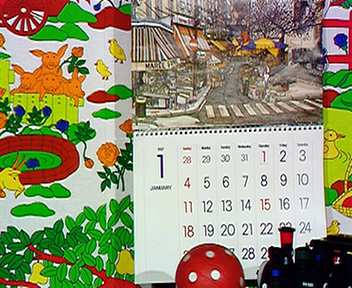

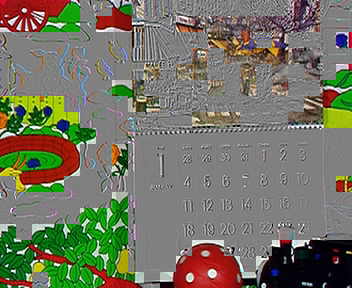

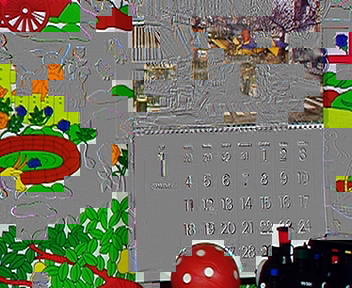

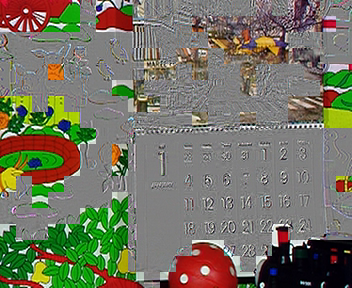

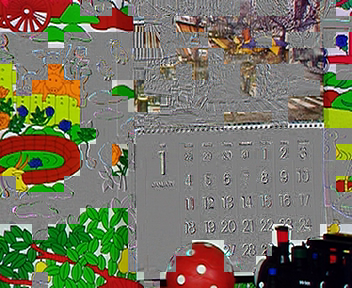

...

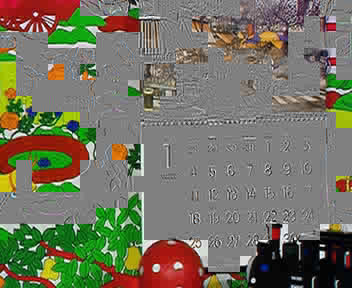

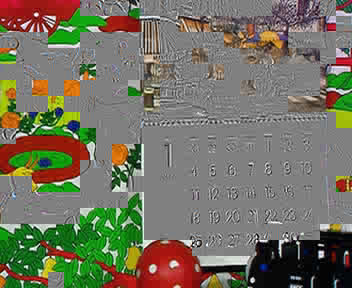

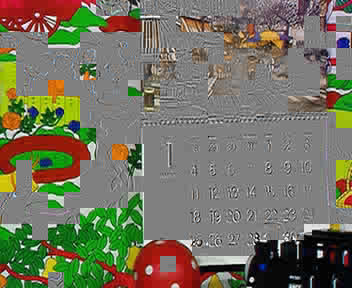

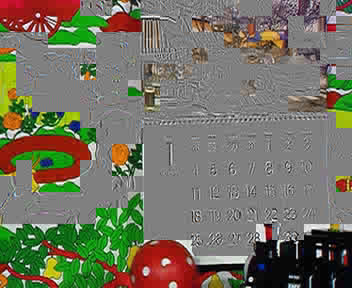

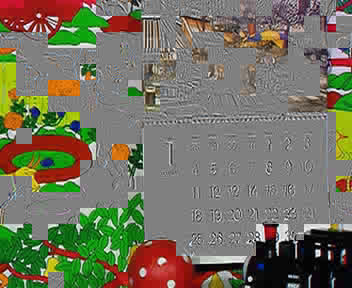

In [6]:
from IPython.display import display, Image
import glob
import time

# Lista de imágenes
imagenes = sorted(glob.glob("/tmp/ipp/residual_*.png"))

# Comando "display" en loop estilo shell
for img_path in imagenes:
    display(Image(filename=img_path))
    time.sleep(1)  # pausa de 1 segundo entre imágenes

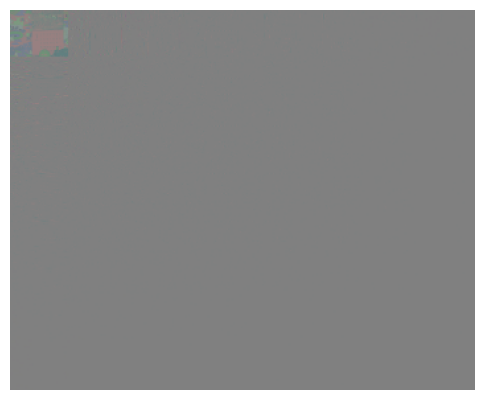

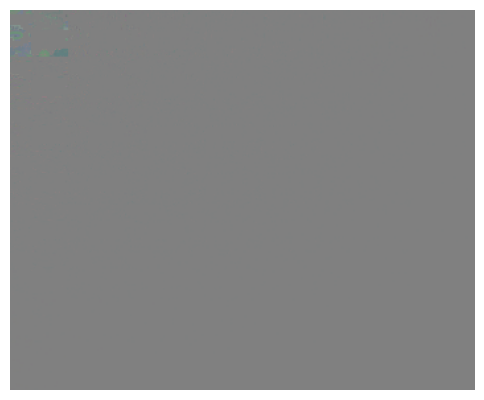

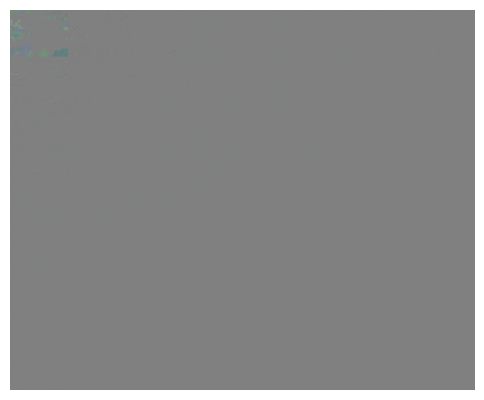

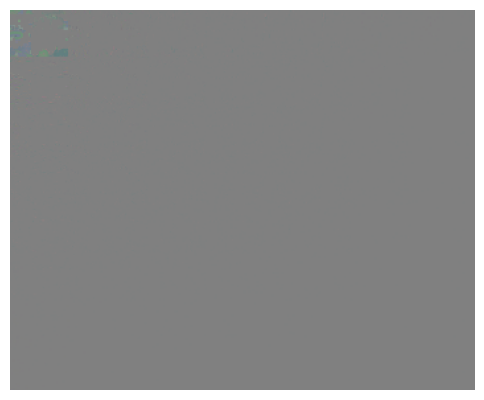

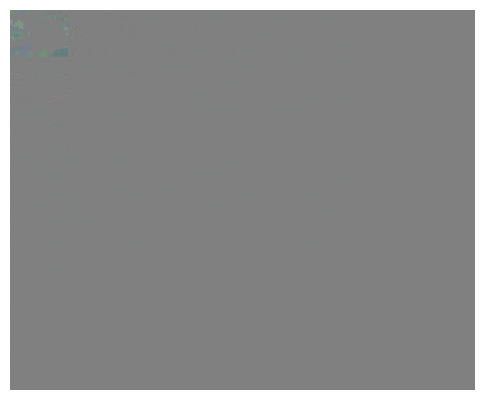

...

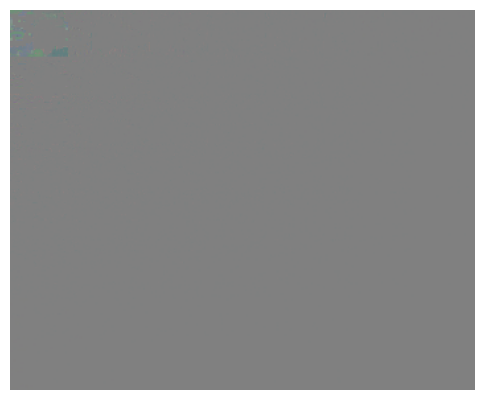

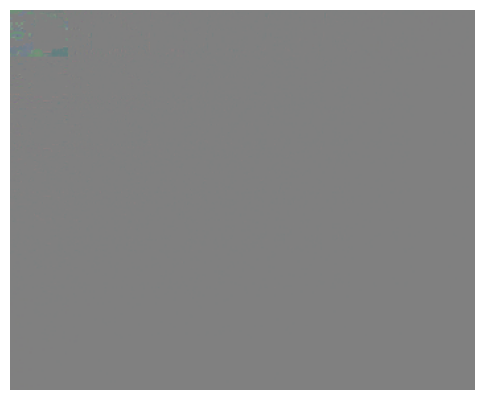

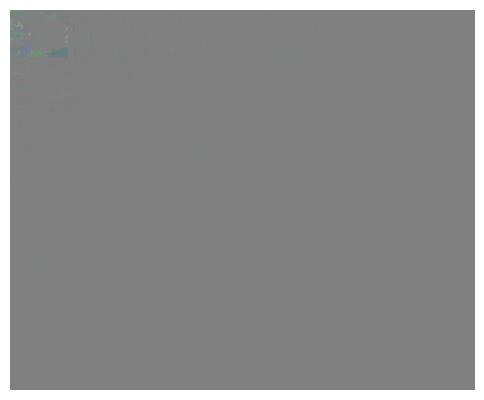

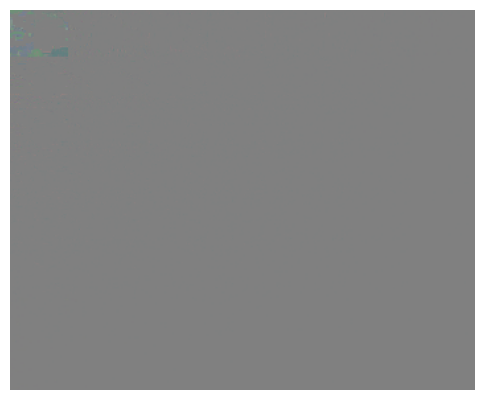

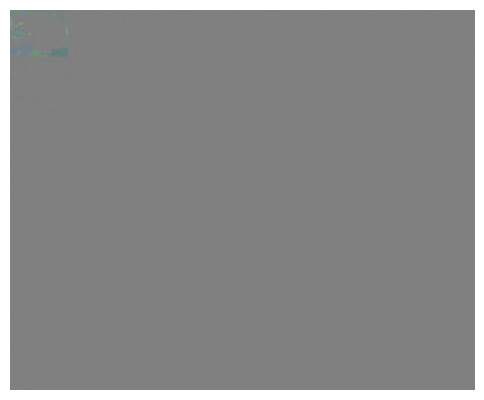

In [17]:
%matplotlib inline
import glob
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread

# Lista de imágenes TIFF
imagenes = sorted(glob.glob("/tmp/ipp/residual_*.tif"))

# Mostrar todas las imágenes una debajo de otra
for img_path in imagenes:
    img = imread(img_path)
    
    plt.figure(figsize=(6,6))  # tamaño de la figura
    plt.imshow(img, cmap='gray', vmin=np.min(img), vmax=np.max(img))  # normaliza
    plt.axis('off')
    plt.show()


In [1]:
%run ../src/IPP.py decode

(INFO) IPP: Using transform codec: 2D-DCT
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0000.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0001.png


Denoising filter = no_filter
main Namespace(debug=False, subparser_name='decode', transform='2D-DCT', number_of_frames=3, block_size_DCT=8, color_transform='YCoCg', perceptual_quantization=False, disable_subbands=False, quantizer='deadzone', QSS=32, filter='no_filter', entropy_image_codec='TIFF', encoded='/tmp/encoded', decoded='/tmp/decoded.png', output_prefix='/tmp/ipp', gop_size=10, block_size=16, func=<function decode at 0x71ebfa12f910>)
36 44
36 44
36 44


(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0002.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0003.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0004.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0005.png


36 44
36 44
36 44
36 44


(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0006.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0007.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0008.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0009.png


36 44
36 44
36 44
36 44


(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0010.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0011.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0012.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0013.png


36 44
36 44
36 44
36 44


(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0014.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0015.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0016.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0017.png


36 44
36 44
36 44
36 44


(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0018.png
(INFO) IPP: Saved reconstructed frame: /tmp/ipp/decoded_0019.png


36 44


In [3]:
!ffplay -i /tmp/ipp/decoded_%04d.png -loop 0

ffplay version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2003-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab